### Magics

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

%load_ext watermark
%watermark -a 'Salomon Tetelepta' -d -t -v -p tensorflow,numpy,pandas,matplotlib -g

Salomon Tetelepta 2019-09-24 08:30:30 

CPython 3.7.4
IPython 7.7.0

tensorflow 1.14.0
numpy 1.16.4
pandas 0.25.0
matplotlib 3.1.1
Git hash: ad081f8902f4a6d83752c53fe7d4807773a21ad1


### Imports

In [2]:
import os
import sys

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

import pickle
from pathlib import Path


# tensorflow
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.compat.v1.keras.models import load_model
from tensorflow.keras.metrics import categorical_accuracy

# import DCNN model
from tensorflow.keras.applications import ResNet50

# import preprocessing functions for model
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_input_resnet50


### Settings

In [3]:
# get project path, and flag if script runs in a file
project_path = Path(os.getcwd(), os.pardir)
output_path = project_path / "output"
model_path = project_path / "models"

# add project root to pythonpath
sys.path.insert(0, str(project_path / "src"))

# import custom packages
from set_cardgame.dataset import *
from set_cardgame.identify import *   
from set_cardgame.utils import *
from set_cardgame.findsets import *

### Load models

In [4]:
# load intermediate DCNN (ResNet50), outputs at best performing layer (stage 3, blockd, first conv layer)
dcnn_model_name = "resnet50-res3d_branch2a.h5"
intermediate_model = load_model(
    model_path / dcnn_model_name,
    custom_objects=None, 
    compile=True
)

# load linear classifier, trained with 8100 images
linear_classifier_model_name = "clf-lr-res3d_branch2a_8100.pkl"
with open(model_path / linear_classifier_model_name, 'rb') as handle:
    best_model = pickle.load(handle)

W0924 08:30:34.709648 4583359936 deprecation.py:506] From /Users/salomon/miniconda3/envs/setdetection/lib/python3.7/site-packages/tensorflow/python/ops/init_ops.py:97: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0924 08:30:34.711668 4583359936 deprecation.py:506] From /Users/salomon/miniconda3/envs/setdetection/lib/python3.7/site-packages/tensorflow/python/ops/init_ops.py:97: calling Zeros.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0924 08:30:34.714106 4583359936 deprecation.py:506] From /Users/salomon/miniconda3/envs/setdetection/lib/python3.7/site-packages/tensorflow/python/ops/init_ops.py:

### Detect SET combinations

In [5]:
# putting it all together
test_images_path = project_path / "test_images"

# resize images to the input shape needed for the model
target_width, target_height = (128, 96)

# load meta data for the dataset (labels and features for each card type)
df_meta = load_metadata()

In [6]:
def stretch(x):
    return 255 * (x - np.min(x)) / (np.max(x) - np.min(x))

def channel_normalisation(img):
    # reshape to 2d
    img_flat = img.reshape(img.shape[0]*img.shape[1], img.shape[2])
    img_flat_norm = ((img_flat - np.mean(img.flat, axis=0)) / np.std(img_flat, axis=0)).reshape(img.shape)
    img_flat_norm[:,:,0] = stretch(img_flat_norm[:,:,0])
    img_flat_norm[:,:,1] = stretch(img_flat_norm[:,:,1])
    img_flat_norm[:,:,2] = stretch(img_flat_norm[:,:,2])
    return img_flat_norm.astype('uint8')

def normalize_cards(imgs):
    imgs_norm = np.zeros_like(identified_images)
    for i in np.arange(imgs.shape[0]):
        card_img = identified_images[i, ...]
        imgs_norm[i, ...] = channel_normalisation(card_img)
    return imgs_norm

In [7]:
def identify_images(img, target_size, label):
    # save a copy
    img_orig = img.copy()

    # preprocess image
    img = preprocess(img)
    
    plt.figure()
    plt.imshow(img)
    plt.savefig(output_path / "debug" / f"preprocess_{label}.png", –)
    
    # find contours
    contours = cv2.findContours(img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[-2]
    
    # get largest contours
    large_contours = get_largest_contours(contours, zscore_threshold=2)
    
    if len(large_contours) == 0:
        logger.warning("no large contours found, using all contours")
        large_contours = contours
    identified_images = []
    bboxes = []
    for i, c in enumerate(large_contours):
        rect = cv2.minAreaRect(c)
        box = cv2.boxPoints(rect).astype(int)
        warped = four_point_transform(img_orig.copy(), box)
        
        # get width and heigt of warped image
        w = warped.shape[1]
        h = warped.shape[0]

        short_side = w if w < h else h
        long_side = w if w > h else h
        
        if not valid_ratio(short_side, long_side, thresh_low=0.5, thresh_high=0.8):
            logger.debug(f"invalid ratio: s/l: {short_side / long_side}")
            continue

        # make sure image is landscape
        if h >= w:
            warped = imutils.rotate_bound(warped, 90)

        # resize image to target size
        resized = cv2.resize(warped, target_size, interpolation=cv2.INTER_AREA)
        
        # add image to output array
        identified_images.append(resized)
        bboxes.append(box)
    logger.debug(f"nr warped: {len(identified_images)}, nr large contours: {len(large_contours)}")
    
    return np.array(identified_images).astype(float), np.array(bboxes)

===
processing: IMG_7802.JPG
number of cards found: 12


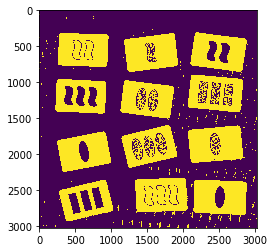

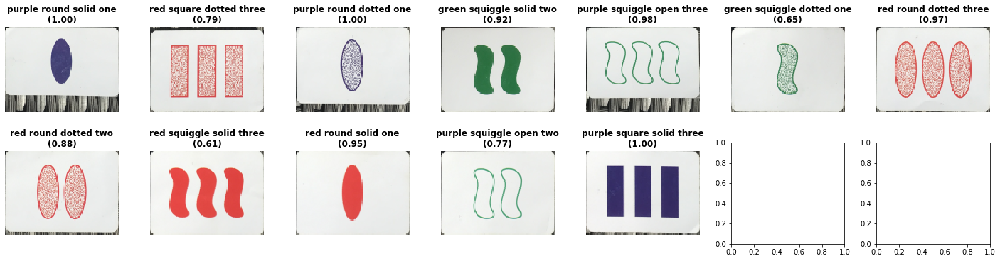

nr sets found: 3
SET 1/3
- purple round dotted one
- purple squiggle open two
- purple square solid three
SET 2/3
- green squiggle solid two
- red round solid one
- purple square solid three
SET 3/3
- green squiggle dotted one
- red squiggle solid three
- purple squiggle open two


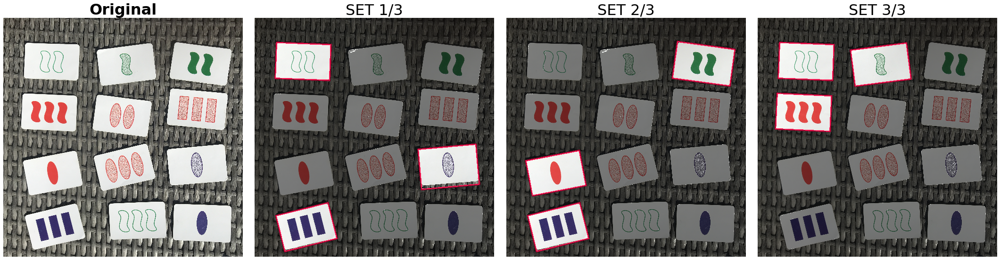

---
===
processing: IMG_6138.JPG
number of cards found: 12


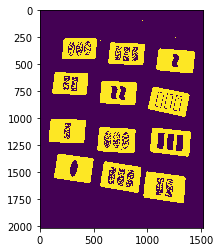

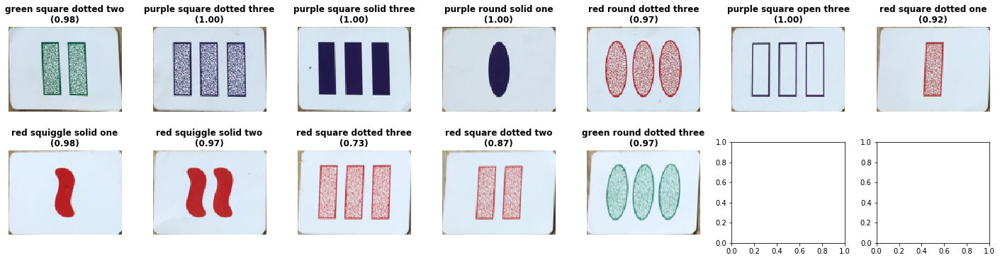

nr sets found: 3
SET 1/3
- green square dotted two
- purple square dotted three
- red square dotted one
SET 2/3
- purple square dotted three
- purple square solid three
- purple square open three
SET 3/3
- red square dotted one
- red square dotted three
- red square dotted two


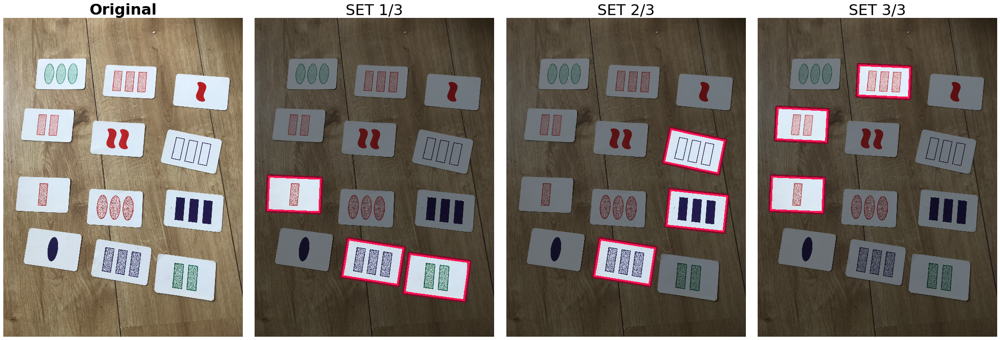

---
===
processing: IMG_6139.JPG
number of cards found: 12


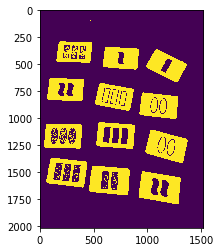

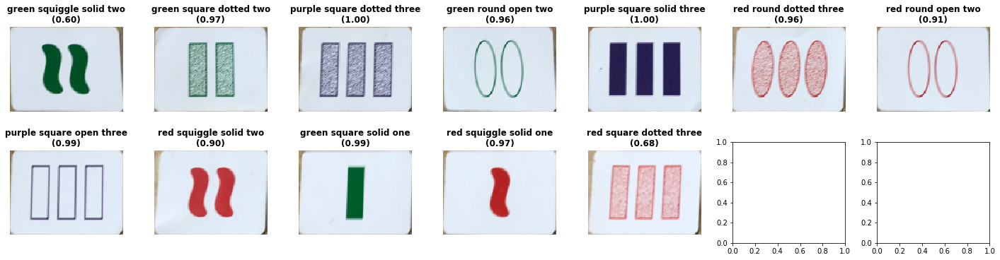

nr sets found: 4
SET 1/4
- green squiggle solid two
- green square dotted two
- green round open two
SET 2/4
- purple square dotted three
- green round open two
- red squiggle solid one
SET 3/4
- purple square dotted three
- purple square solid three
- purple square open three
SET 4/4
- red round open two
- red squiggle solid one
- red square dotted three


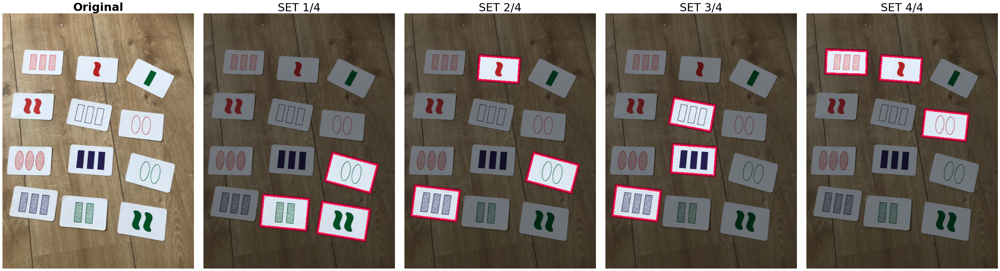

---
===
processing: IMG_6137.JPG
number of cards found: 12


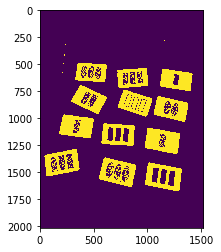

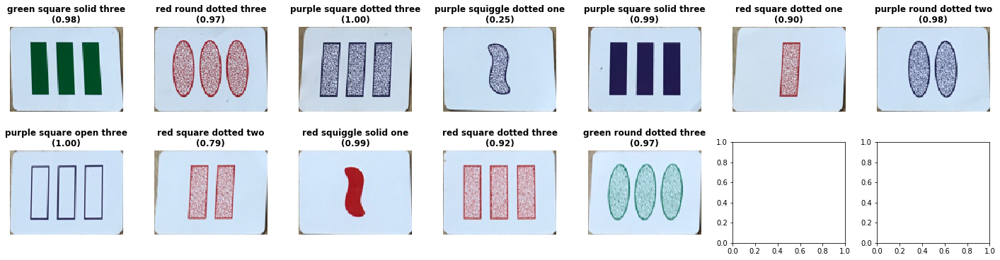

nr sets found: 5
SET 1/5
- green square solid three
- purple square open three
- red square dotted three
SET 2/5
- purple square dotted three
- purple squiggle dotted one
- purple round dotted two
SET 3/5
- purple square dotted three
- purple square solid three
- purple square open three
SET 4/5
- purple squiggle dotted one
- red square dotted two
- green round dotted three
SET 5/5
- red square dotted one
- red square dotted two
- red square dotted three


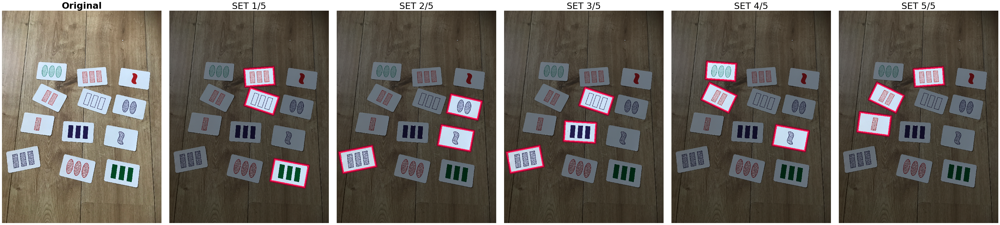

---
===
processing: IMG_6136.JPG
number of cards found: 12


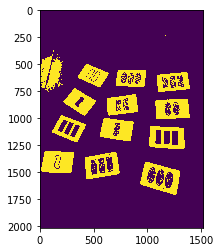

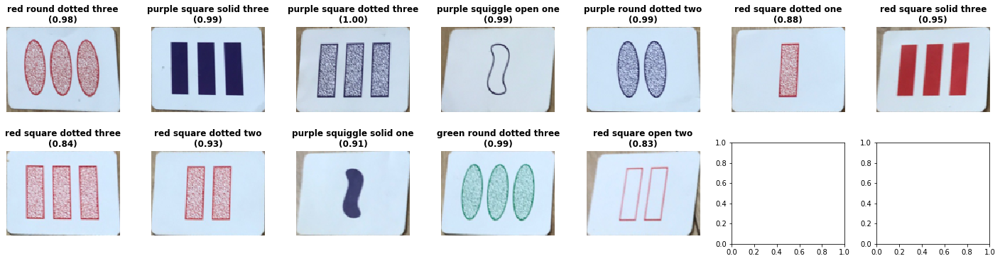

nr sets found: 4
SET 1/4
- purple square solid three
- purple squiggle open one
- purple round dotted two
SET 2/4
- red square dotted one
- red square solid three
- red square open two
SET 3/4
- red square dotted one
- red square dotted three
- red square dotted two
SET 4/4
- purple squiggle solid one
- green round dotted three
- red square open two


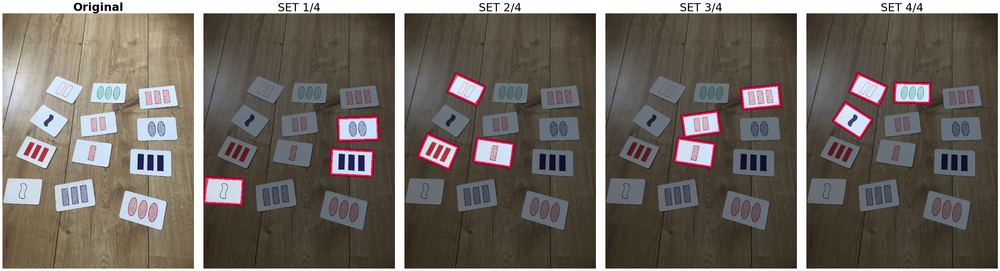

---


In [9]:
# loop throught all test images
for image_name in [img for img in os.listdir(test_images_path) if img.lower().endswith(".jpg")]:
    print(f"===")
    print(f"processing: {image_name}")
    
    # read image
    img = cv2.imread(str(test_images_path / image_name))
        
    # identify the different cards
    identified_images, bboxes = identify_images(img, target_size=(target_width, target_height), label=image_name)
    
    #identified_images = normalize_cards(identified_images)
    
    nr_found_cards = len(identified_images)
    print(f"number of cards found: {nr_found_cards}")
    
    # generate image embeddings for each card
    image_embeddings = intermediate_model.predict(identified_images).reshape(identified_images.shape[0], -1)
    
    # classify cards
    predictions = best_model.predict(image_embeddings)
    predictions_proba = best_model.predict_proba(image_embeddings)
    
    #print("predictions:", predictions)
    #print("predictions_proba:", predictions_proba)
    
    # get feature codes for each prediction
    predictions_features = get_feature_codes(df_meta, predictions)
    
    # get feature labels for each prediction
    predictions_labels = get_feature_labels(df_meta, predictions)
    
    #print(f"predictions_labels: {predictions_labels}")
    
    nrows = 2
    ncols = np.maximum(nr_found_cards // 2+1, 2)
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5))
    fig.tight_layout()

    for i, card_img in enumerate(identified_images):
        r = i // ncols
        c = i % ncols
        ax = axs[r, c]
        # first image is the original
        ax.set_title(f"{predictions_labels[i]}\n({np.max(predictions_proba[i]):.2f})", fontsize=12, fontweight="bold")
        
        card_img_rgb = cv2.cvtColor(card_img.astype('uint8'), cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(output_path / f"{i}_{image_name}.png"), card_img)
     
        ax.imshow(card_img_rgb / 255)
        ax.axis('off')
    plt.show()
    
    if len(predictions_features) != len(np.unique(predictions_features, axis=0)):
        print(f"found duplicate cards for {image_name}")
        print("skip setdetection")
        print("---")
        continue
    
    # find all sets
    sets = findsets(predictions_features)
    
    # convert image to rgb for plotting
    img_rgb = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)
    
    # merge sets with the original image
    set_images = merge_sets_with_image(img_rgb, image_name, bboxes, sets, line_color=(255, 22, 84))
    
    # plot the merged images
    nr_sets_found = len(set_images)
    
    if nr_sets_found > 0:
        print(f"nr sets found: {nr_sets_found}")
        fig, axs = plt.subplots(nrows=1, ncols=nr_sets_found+1, figsize=(nr_sets_found*10, nr_sets_found*5))
        fig.tight_layout()

        # Make nice margins
        plt.subplots_adjust(wspace=0.05)

        # first image is the original
        axs[0].imshow(img_rgb)
        axs[0].set_title("Original", fontsize=32, fontweight="bold")
        axs[0].axis('off')

        # next images are found sets
        for i, set_image in enumerate(set_images):
            print(f"SET {i+1}/{nr_sets_found}")
            for card in sets[i]:
                img_label = get_card_data(df_meta, predictions[card])['label']
                print(f"- {img_label}")
            axs[i+1].set_title(f"SET {i+1}/{nr_sets_found}", fontsize=32)
            axs[i+1].imshow(set_image)
            axs[i+1].axis('off')

        # save and show images
        plt.savefig(output_path / f"found_sets_{image_name}.png", bbox_inches='tight')
        plt.show()
    else:
        print("no sets found")
    print("---")

### compare histograms

In [20]:
def plot_histogram(img):
    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
    axs[0].imshow(img)
    axs[1].set_title("red channel")
    axs[1].hist(img[:,:,0].reshape(img.shape[0]*img.shape[1]))
    axs[2].set_title("green channel")
    axs[2].hist(img[:,:,1].reshape(img.shape[0]*img.shape[1]))
    axs[3].set_title("blue channel")
    axs[3].hist(img[:,:,2].reshape(img.shape[0]*img.shape[1]))

def plot_scatter(img):
    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
    for i, colors in enumerate([("red", "green"), ("red", "blue"), ("blue", "green")]):
        color_channels = {'red': 0, 'green': 1, 'blue': 2}
        channels = (color_channels[colors[0]], color_channels[colors[1]])
        x = img[:,:,channels[0]].reshape(img.shape[0]*img.shape[1])
        y = img[:,:,channels[1]].reshape(img.shape[0]*img.shape[1])

        axs[0].imshow(img)
        axs[i+1].set_title(f"{colors[0]} vs {colors[1]}")
        axs[i+1].set_xlim(0, 255)
        axs[i+1].set_ylim(0, 255)    
        axs[i+1].set_xlabel(colors[0])
        axs[i+1].set_ylabel(colors[1])
        axs[i+1].plot(x, y, linestyle="None", marker=".", color="k", markersize=2)

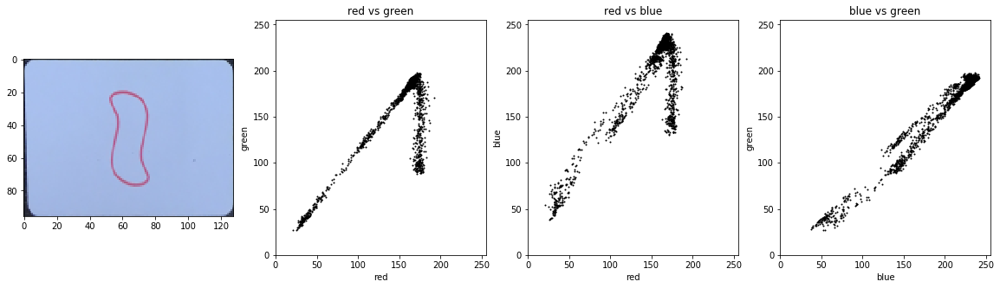

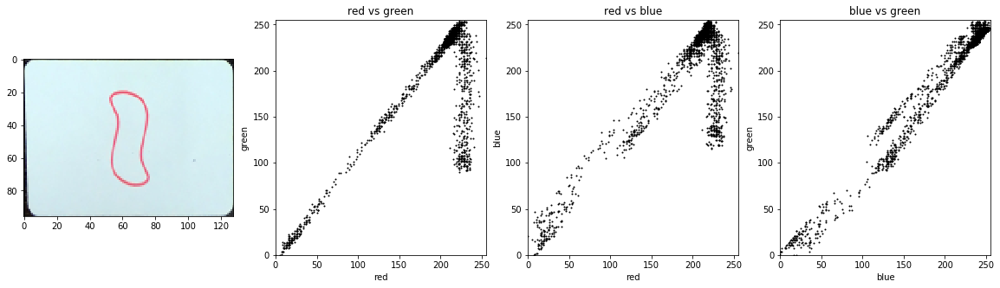

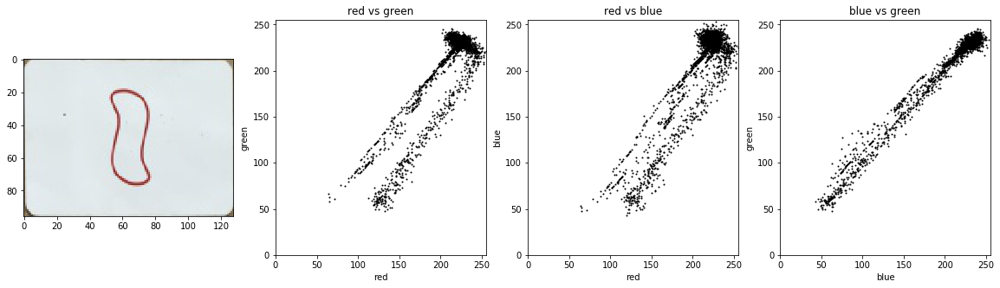

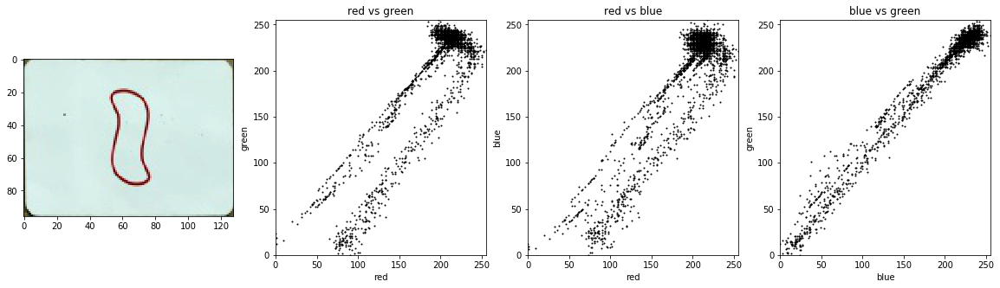

In [21]:
#image1 = str(output_path / "6_IMG_4058.JPG.png")
#image2 = str(project_path / "src" / "set_cardgame" / "data" / "128x96" / "train" / "72" / "1_purple_square_solid_one.jpg")

image1 = str(output_path / "5_IMG_4058.JPG.png")
image2 = str(project_path / "src" / "set_cardgame" / "data" / "128x96" / "train" / "15" / "1_red_squiggle_open_one.jpg")

img1 = cv2.imread(image1)
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img1_rgb_norm = channel_normalisation(img1_rgb)

img2 = cv2.imread(image2)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2_rgb_norm = channel_normalisation(img2_rgb)

#plot_histogram(img1_rgb)
plot_scatter(img1_rgb)
plot_scatter(img1_rgb_norm)
plot_scatter(img2_rgb)
plot_scatter(img2_rgb_norm)
# plot_histogram(img2_rgb_norm)
# plot_scatter(img2_rgb_norm)
# #plot_histogram(img2_rgb)
# plot_scatter(img2_rgb)

### Apply diagonal transformation

In [ ]:
plot_histogram(img1_rgb_norm)
plot_scatter(img1_rgb_norm)

plot_histogram(img2_rgb_norm)
plot_scatter(img2_rgb_norm)

In [236]:
def apply_diagonal_transformation(img, beta=(1, 1, 1)):
    # transformation matrix
    t = np.array([[beta[0], 0, 0], [0, beta[1], 0], [0, 0, beta[2]]])
    
    # reshape to 2d
    img_flat = img.reshape(img.shape[0]*img.shape[1], img.shape[2])

    # apply transformation
    img_flat_new = np.dot(img_flat, t)

    return img_flat_new.reshape(img.shape).astype('uint8')

In [237]:
def plot_image_transforms(img, beta_list):
    for beta in beta_list:
        img_new = apply_diagonal_transformation(img.copy(), beta=beta)
        print(np.max(img_new))
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
        axs[0].set_title("original")
        axs[0].imshow(img)
        axs[1].set_title(f"beta: ({beta[0]:.2f}, {beta[1]:.2f}, {beta[2]:.2f})")
        axs[1].imshow(img_new)
        plot_scatter(img_new)

In [238]:
image1 = str(output_path / "6_IMG_4058.JPG.png")
image2 = str(project_path / "src" / "set_cardgame" / "data" / "128x96" / "train" / "72" / "1_purple_square_solid_one.jpg")

img1 = cv2.imread(image1)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread(image2)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

255
255
255
255
255
255


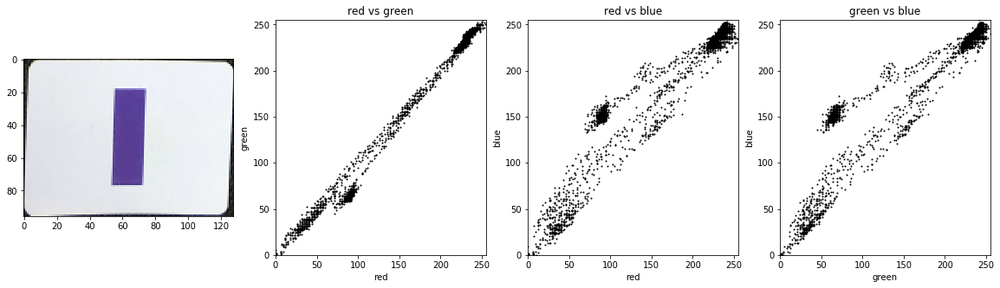

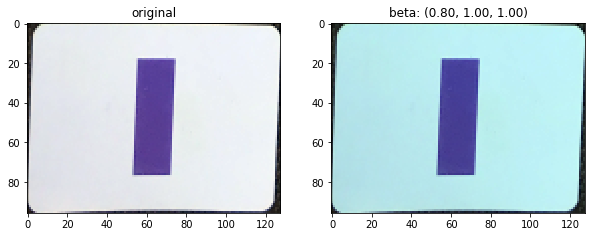

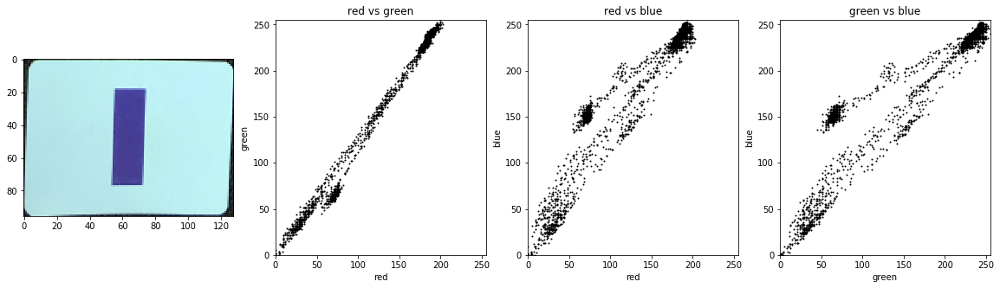

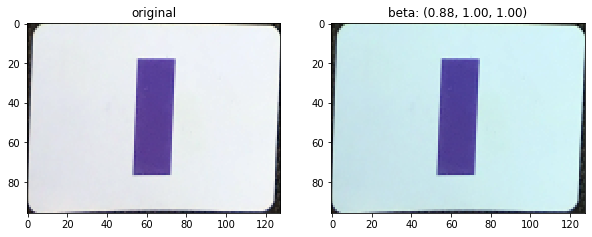

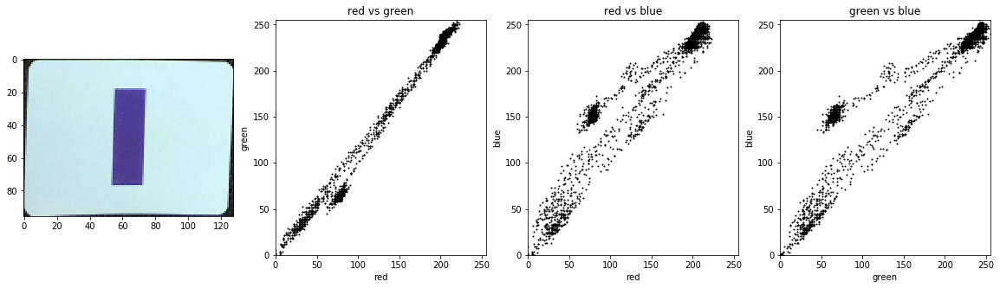

...

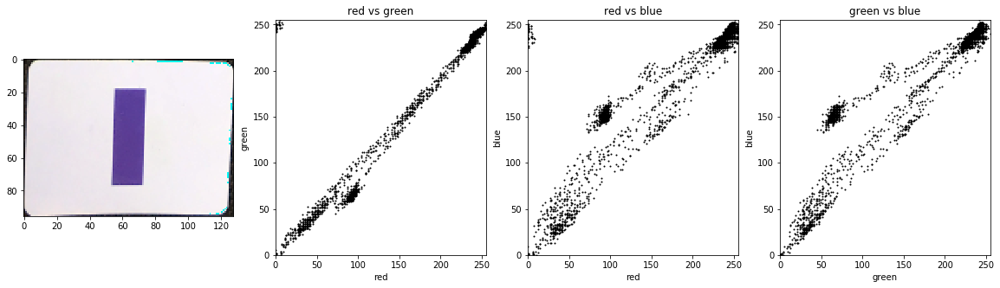

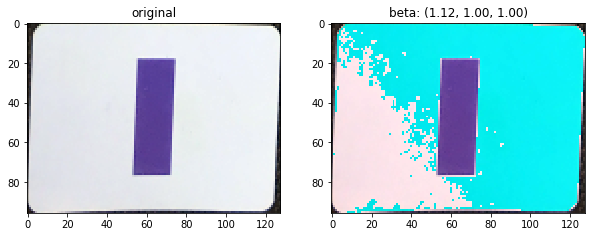

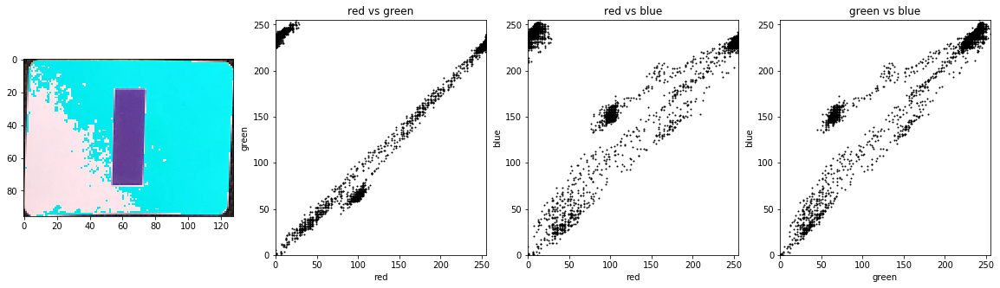

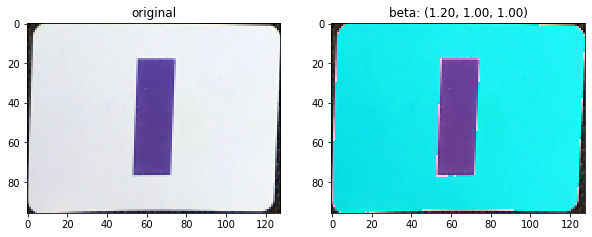

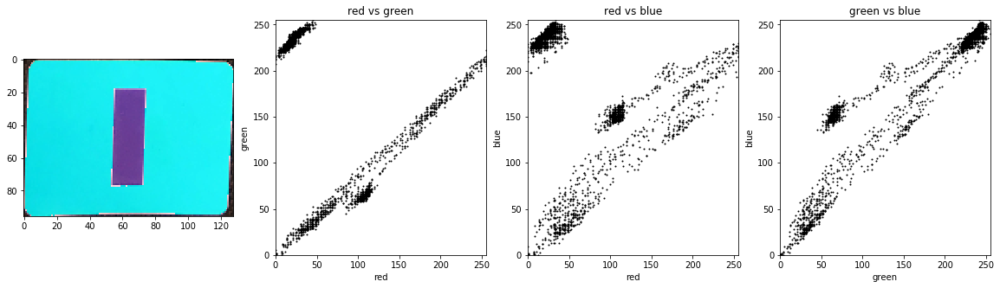

In [239]:
beta_list = [(r, 1, 1) for r in np.linspace(0.8, 1.2, 6)]
plot_scatter(img1)
plot_image_transforms(img1, beta_list)

255
255
255
255
255
255


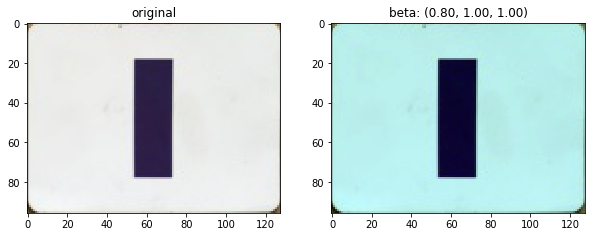

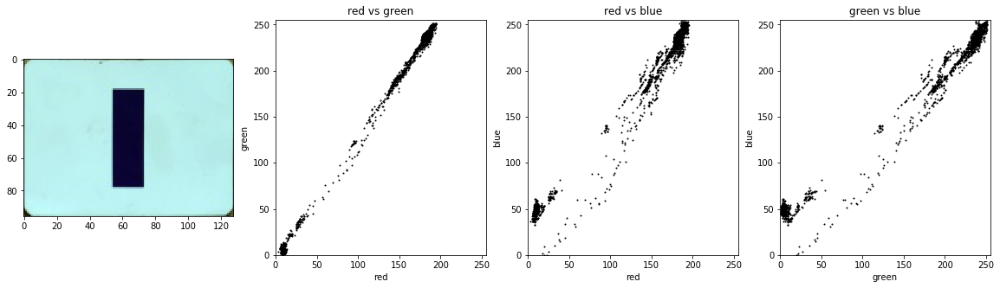

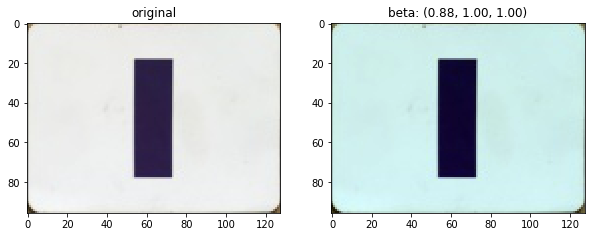

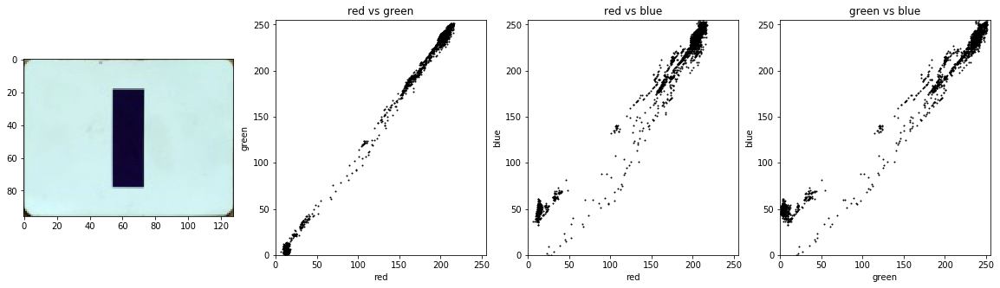

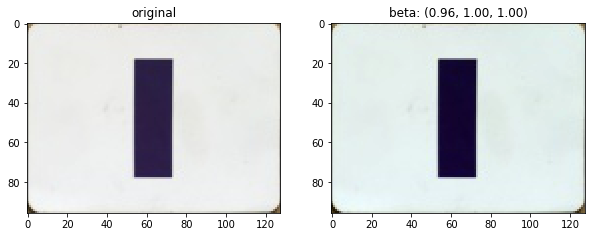

...

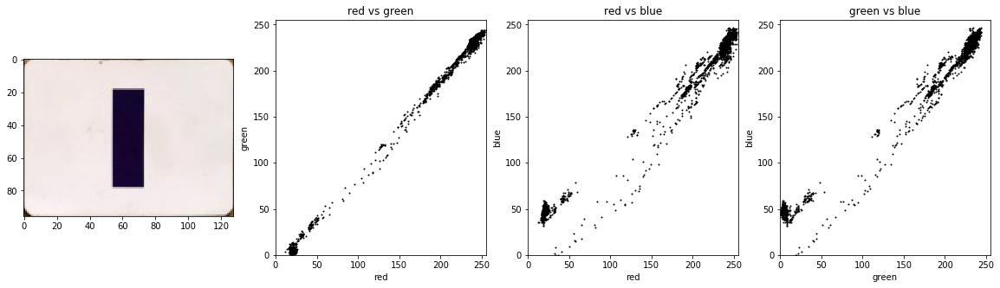

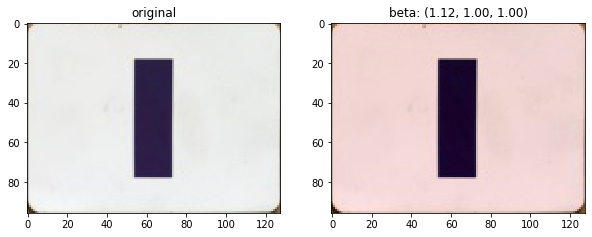

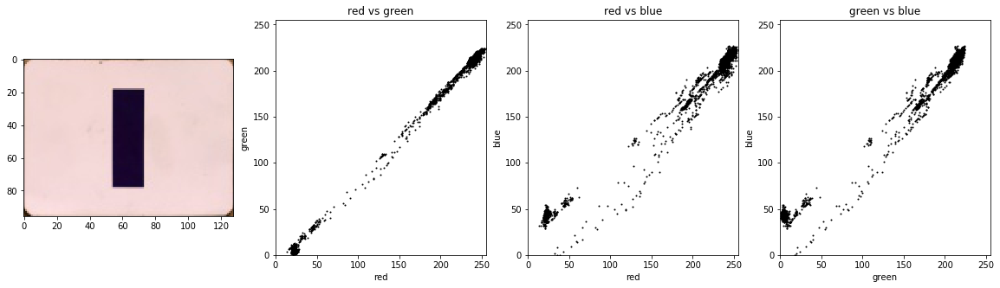

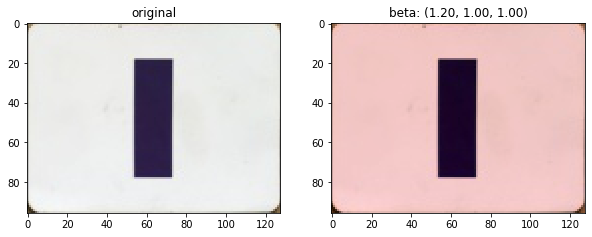

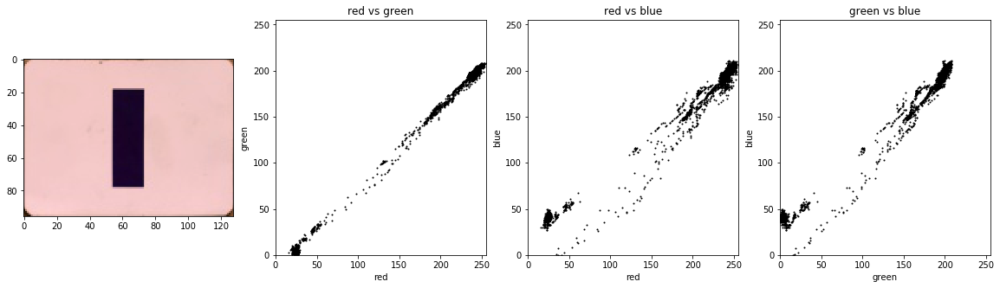

In [230]:
plot_image_transforms(img2/255, beta_list)